In [1]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from torch import nn


In [2]:
print(torch.__version__)
print(torch.cuda.is_available())
device = torch.device("cuda")

2.4.0
True


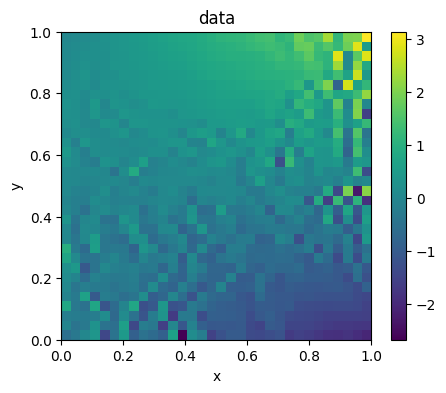

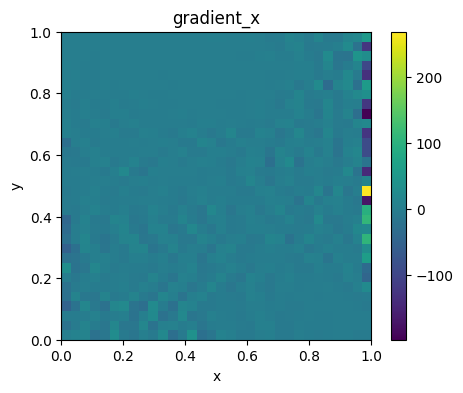

In [3]:
L = 1    
T = 1          
Nx = 32          
Nt = 32          

x = np.linspace(0, L, Nx)
y = np.linspace(0, T, Nt) 
dx = L / (Nx - 1)
dy = T / (Nt - 1)
data = np.load('Laplace_Inverse_x_noise0.01.npy')
gradient_x = np.gradient(data, dx, axis = 1, edge_order=2)
gradient_y = np.gradient(data, dy, axis = 0, edge_order=2)
gradient_xx = np.gradient(gradient_x, dx, axis = 1, edge_order=2)
gradient_yy = np.gradient(gradient_y, dy, axis = 0, edge_order=2)

plt.figure(figsize=(5, 4))
plt.imshow(data, aspect='auto',extent=[np.min(x), np.max(x), np.min(y), np.max(y)], cmap='viridis')
plt.title('data')
plt.xlabel('x')
plt.ylabel('y')
plt.colorbar()
plt.show()

plt.figure(figsize=(5, 4))
plt.imshow(gradient_x, aspect='auto',extent=[np.min(x), np.max(x), np.min(y), np.max(y)], cmap='viridis')
plt.title('gradient_x')
plt.xlabel('x')
plt.ylabel('y')
plt.colorbar()
plt.show()

data = torch.from_numpy(data)
x = torch.from_numpy(x)
t = torch.from_numpy(y)
gradient_x = torch.from_numpy(gradient_x)
gradient_xx = torch.from_numpy(gradient_xx)
gradient_t = torch.from_numpy(gradient_y)
gradient_tt = torch.from_numpy(gradient_yy)


x = x.float().to(device)
t = t.float().to(device)
data = data.float().to(device)
gradient_x = gradient_x.float().to(device)
gradient_xx = gradient_xx.float().to(device)
gradient_t = gradient_t.float().to(device)
gradient_tt = gradient_tt.float().to(device)
dx1 = L / (Nx - 1)
dy1 = T / (Nt - 1)

In [4]:
#обучение на одном интеграле с early stopping на loss и на градиенты и с динамическим lr (лучше получается по x, те output2)
import torch.optim as optim
model = torch.nn.Sequential(
    torch.nn.Linear(2, 1024),
    torch.nn.ReLU(),
    torch.nn.Linear(1024, 512),
    torch.nn.ReLU(),
    torch.nn.Linear(512, 256),
    torch.nn.ReLU(),
    torch.nn.Linear(256, 128),
    torch.nn.ReLU(),
    torch.nn.Linear(128, 64),
    torch.nn.ReLU(),
    torch.nn.Linear(64, 32),
    torch.nn.ReLU(),
    torch.nn.Linear(32, 16),
    torch.nn.ReLU(),
    torch.nn.Linear(16, 8),
    torch.nn.ReLU(),
    torch.nn.Linear(8, 2)
).to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=2000, factor=0.7)#для динамического дк

grid_points = torch.stack(torch.meshgrid(t, x, indexing='ij'), dim=-1).reshape(-1, 2).to(device)

def integrate_gradients(dx, dy, initial_value):
    integral_x = torch.zeros_like(dx)
    integral_x[0] = initial_value  
    for i in range(1, dx.shape[0]):
        integral_x[i] = integral_x[i - 1] + (((dx[i] + dx[i - 1]) * dx1)) / 2  
    
    integral_y = torch.zeros_like(dy)
    integral_y[:, 0] = integral_x[:, 0] 
    
    for j in range(1, dy.shape[1]):
        integral_y[:, j] = integral_y[:, j - 1] + (((dy[:, j] + dy[:, j - 1]) * dy1)) / 2  

    return integral_y

losses = []
initial_value = data[0, 0]
best_loss = float('inf')#хранит наименьшее значение потерь, достигнутое моделью, изначально оно установлено в бесконечность
patience_counter = 0#отслеживает количество эпох с ухудшением потерь
patience_limit = 400000  #задает максимальное количество эпох без улучшения, после которого обучение будет остановлено
target_accuracy = 0.0005  # желаемая точность

for epoch in range(400000):
    optimizer.zero_grad()
    output = model(grid_points).reshape(32, 32, 2).to(device)
    output1 = output[:,:,0]
    output2 = output[:,:,1]
    integral = integrate_gradients(output1, output2, initial_value).to(device)
    loss = criterion(integral, data)                                                   
    loss.backward()                                                                   
    optimizer.step()                                                                  
    # Динамическое изменение learning rate
    scheduler.step(loss)#позволяет планировщику изменять lr на основе текущих потерь, если потери не улучшаются в течение заданного количества эпох (patience), lr уменьшается на указанный фактор
    losses.append(loss.item())                                                        
    print(f'Epoch {epoch}, Loss: {loss.item()}')
    '''
    # Проверка на достижение целевой точности
    accuracy_x = torch.mean(torch.square(gradient_x - output1))
    accuracy_y = torch.mean(torch.square(gradient_y - output2))
    accuracy = (torch.mean(torch.square(gradient_x - output1)) + torch.mean(torch.square(gradient_y - output2))) / 2
    print('mse_gradients_x = ', accuracy_x)
    print('mse_gradients_y = ', accuracy_y)
    print('mse_gradients = ', accuracy)
    
    if accuracy_y < target_accuracy:
        print(f'Целевая точность достигнута на эпохе {epoch}. Остановка обучения.')
        break
    '''
    # Ранняя остановка
    if loss.item() < best_loss:#Если текущие потери меньше, чем best_loss, то обновляем best_loss и сбрасываем patience_counter
        best_loss = loss.item()
        patience_counter = 0
    else:
        patience_counter += 1#Если текущие потери не улучшаются, увеличиваем patience_counter
        
        if patience_counter >= patience_limit:#Если patience_counter достигает patience_limit, выводим сообщение о срабатывании ранней остановки и прерываем цикл обучения
            print("Early stopping triggered.")
            break

print(output1.shape)
print(output2.shape)



Epoch 0, Loss: 0.6443692445755005
Epoch 1, Loss: 0.6424747705459595
Epoch 2, Loss: 0.640281617641449
Epoch 3, Loss: 0.6377289891242981
Epoch 4, Loss: 0.6347252130508423
Epoch 5, Loss: 0.6310269832611084
Epoch 6, Loss: 0.6264339089393616
Epoch 7, Loss: 0.621738612651825
Epoch 8, Loss: 0.6159235835075378
Epoch 9, Loss: 0.6086676120758057
Epoch 10, Loss: 0.5992656350135803
Epoch 11, Loss: 0.5867043733596802
Epoch 12, Loss: 0.570521354675293
Epoch 13, Loss: 0.5505461692810059
Epoch 14, Loss: 0.5284581184387207
Epoch 15, Loss: 0.5037605166435242
Epoch 16, Loss: 0.4759591221809387
Epoch 17, Loss: 0.4479774534702301
Epoch 18, Loss: 0.419972687959671
Epoch 19, Loss: 0.39294999837875366
Epoch 20, Loss: 0.3674056828022003
Epoch 21, Loss: 0.3452547788619995
Epoch 22, Loss: 0.3294633626937866
Epoch 23, Loss: 0.3233800530433655
Epoch 24, Loss: 0.37103986740112305
Epoch 25, Loss: 0.31277716159820557
Epoch 26, Loss: 0.33797094225883484
Epoch 27, Loss: 0.2910045087337494
Epoch 28, Loss: 0.315152406692

1219.0996
4809.6816


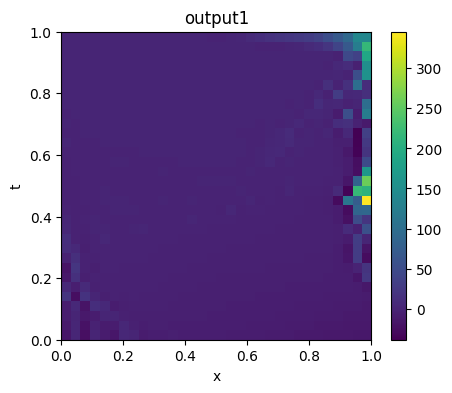

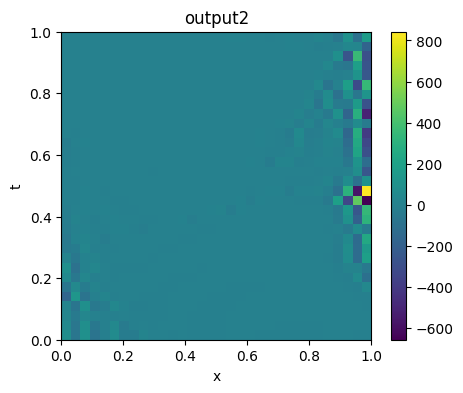

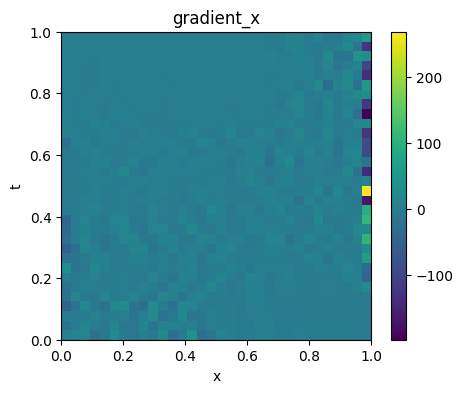

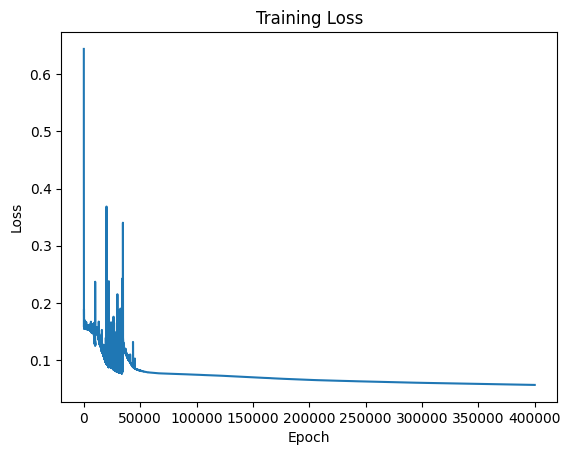

In [5]:
output1 = output1.detach().cpu().numpy() 
output2 = output2.detach().cpu().numpy() 
x =  x.detach().cpu().numpy() 
t =  t.detach().cpu().numpy() 
data = data.detach().cpu().numpy() 
gradient_x = gradient_x.detach().cpu().numpy() 
gradient_t = gradient_t.detach().cpu().numpy() 

print((np.square(output1 - gradient_x)).mean(axis=None))
print((np.square(output2 - gradient_t)).mean(axis=None))

plt.figure(figsize=(5, 4))
plt.imshow(output1, aspect='auto',extent=[np.min(x), np.max(x), np.min(t), np.max(t)], cmap='viridis')
plt.title('output1')
plt.xlabel('x')
plt.ylabel('t')
plt.colorbar()
plt.show()


plt.figure(figsize=(5, 4))
plt.imshow(output2, aspect='auto',extent=[np.min(x), np.max(x), np.min(t), np.max(t)], cmap='viridis')
plt.title('output2')
plt.xlabel('x')
plt.ylabel('t')
plt.colorbar()
plt.show()

plt.figure(figsize=(5, 4))
plt.imshow(gradient_x, aspect='auto',extent=[np.min(x), np.max(x), np.min(t), np.max(t)], cmap='viridis')
plt.title('gradient_x')
plt.xlabel('x')
plt.ylabel('t')
plt.colorbar()
plt.show()

#lt.figure(figsize=(5, 4))
#plt.imshow(gradient_t, aspect='auto',extent=[np.min(x), np.max(x), np.min(t), np.max(t)], cmap='viridis')
#plt.title('gradient_t')
#plt.xlabel('x')
#plt.ylabel('t')
#plt.colorbar()
#plt.show()


plt.plot(losses)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()

In [6]:
np.save('Laplace_Inverse_xx_noise0.01.npy', output2)

32
32
3.229687127891784e-05
3.333133755136205e-05
1.9867616995955396e-05


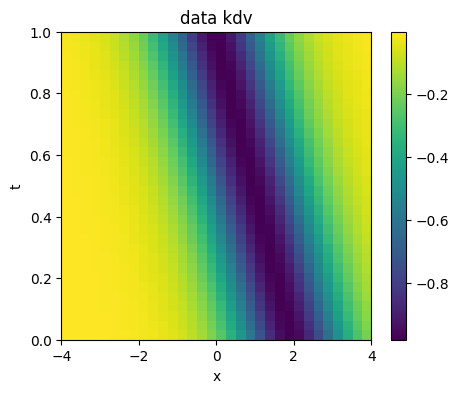

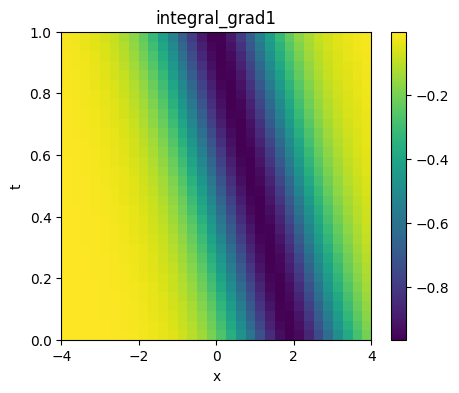

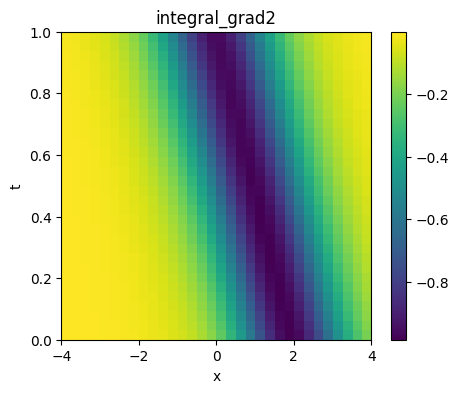

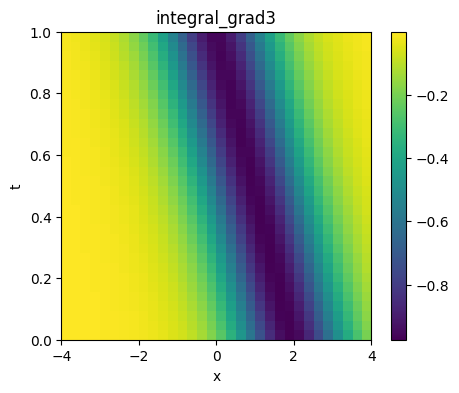

In [23]:
import numpy as np

x = np.linspace(-4, 4, 32)  
y = np.linspace(0, 1, 32)
data = np.load('data_kdv_noise0.npy')

# Функция для вычисления производных
def compute_gradients(data):
    dx = np.gradient(data, axis=0) 
    dy = np.gradient(data, axis=1)
    return dx, dy

def integrate_gradients1(dx, dy, initial_value):
    
    integral_x = np.zeros_like(dx)
    integral_x[0] = initial_value  
    for i in range(1, dx.shape[0]):
        integral_x[i] = integral_x[i - 1] + ((dx[i] + dx[i - 1])) / 2  
    
    integral_y = np.zeros_like(dy)
    integral_y[:, 0] = integral_x[:, 0] 
    
    for j in range(1, dy.shape[1]):
        integral_y[:, j] = integral_y[:, j - 1] + ((dy[:, j] + dy[:, j - 1])) / 2  

    return integral_y

def integrate_gradients2(dx, dy, initial_value):
    
    integral_y= np.zeros_like(dx)
    integral_y[0] = initial_value  
    for i in range(1, dy.shape[0]):
        integral_y[:, i] = integral_y[:, i - 1] + ((dy[:, i] + dy[:, i - 1])) / 2  
    
    integral_x = np.zeros_like(dy)
    integral_x[0] = integral_y[0] 
    
    for j in range(1, dx.shape[1]):
        integral_x[j] = integral_x[j - 1] + ((dx[j] + dx[j - 1])) / 2  

    return integral_x 


dx, dy = compute_gradients(data)

print(dy.shape[0])
print(dx.shape[1])

result1 = integrate_gradients1(dx, dy, initial_value)
result2 = integrate_gradients2(dx, dy, initial_value)

result3 = ((integrate_gradients1(dx, dy, initial_value) + integrate_gradients2(dx, dy, initial_value)) / 2)


print((np.square(data - result1)).mean(axis=None))
print((np.square(data - result2)).mean(axis=None))
print((np.square(data - result3)).mean(axis=None))


plt.figure(figsize=(5, 4))
plt.imshow(data, aspect='auto', extent=[np.min(x), np.max(x),np.min(t), np.max(t)], cmap='viridis')
plt.colorbar()
plt.title('data kdv')
plt.xlabel('x')
plt.ylabel('t')
plt.show()

plt.figure(figsize=(5, 4))
plt.imshow(result1, aspect='auto', extent=[np.min(x), np.max(x),np.min(t), np.max(t)], cmap='viridis')
plt.colorbar()
plt.title('integral_grad1')
plt.xlabel('x')
plt.ylabel('t')
plt.show()


plt.figure(figsize=(5, 4))
plt.imshow(result2, aspect='auto', extent=[np.min(x), np.max(x),np.min(t), np.max(t)], cmap='viridis')
plt.colorbar()
plt.title('integral_grad2')
plt.xlabel('x')
plt.ylabel('t')
plt.show()

plt.figure(figsize=(5, 4))
plt.imshow(result3, aspect='auto', extent=[np.min(x), np.max(x),np.min(t), np.max(t)], cmap='viridis')
plt.colorbar()
plt.title('integral_grad3')
plt.xlabel('x')
plt.ylabel('t')
plt.show()
